# Исследование рынка заведений общественного питания в г. Москва

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Основной задачей данного исследования является исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Также по результатам исследования необходимо подготовить для инвесторов информативную и лаконичную презентацию.

Для работы нам предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Загрузка данных и изучение общей информации

Импортируем все необходимые для работы библиотеки.

In [1]:
import re
import pandas as pd
import numpy as np
import plotly.express as px

from plotly.subplots import make_subplots
from plotly import graph_objects as go 
from matplotlib import pyplot as plt
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster

import plotly.io as pio
pio.renderers.default = 'png'
pio.renderers['png'].scale = 1.2

Загрузим и прочитаем предоставленный для работы датасет.

In [2]:
try:
    df = pd.read_csv('datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Описание данных:**

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [4]:
print(f'Всего в датасете представлено {len(df)} заведений.')

Всего в датасете представлено 8406 заведений.


Значения в столбцах `lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup`, `seats` представляют собой количественный тип данных, в столбцах `name`, `category`, `address`, `district`, `hours`, `avg_bill`, `price` - качественный.

Выведем информацию о датасете.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Посмотрим на описание статистик датасета.

In [6]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В датасете присутствуют заведения с количеством посадочных мест до 1288, также стоит обратить внимание на заведения с аномально большими средним чеком и стоимостью чашки капучино. Более детально посмотрим на заведения с аномально большими значениями при предобработке данных.

Сохраним начальный размер датасета в переменную `old_df`.

In [7]:
old_df = len(df)

## Предобработка данных

Проверим данные на наличие полных дубликатов строк, а также посмотрим на количество пропусков по столбцам.

In [8]:
print('Количество полных дубликатов строк:', df.duplicated().sum())
print('')
print('Количество пропусков по столбцам:')
print(df.isna().sum())

Количество полных дубликатов строк: 0

Количество пропусков по столбцам:
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Полные дубликаты строк отсутствуют. Пропуски имеются в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`.

Для столбцов `hours`, `price`, `avg_bill`, `seats` на основании данных датафрейма заполнить пропуски не представляется возможным. 

Проверим, имеются ли пропуски в столбцах `middle_avg_bill` и `middle_coffee_cup` для тех заведений, где указан средний счет или цена чашки капучино.

In [9]:
df[df['avg_bill'].str.count('счёт') > 0]['middle_avg_bill'].isna().sum()

0

In [10]:
df[df['avg_bill'].str.count('капучино') > 0]['middle_coffee_cup'].isna().sum()

0

Таких пропусков нет.

In [11]:
df['name'].str.lower()

0                     wowфли
1             четыре комнаты
2                      хазри
3       dormouse coffee shop
4                  иль марко
                ...         
8401              суши мания
8402               миславнес
8403                 самовар
8404            чайхана sabr
8405              kebab time
Name: name, Length: 8406, dtype: object

Посмотрим есть ли неполные дубликаты строк. Найдем дубликаты вида *название + адрес*. Для этого создадим датафрейм, который будет содержать дублирующиеся строки названия заведения и адреса расположения в строчном виде.

In [12]:
t = df[df[['name', 'address']].apply(lambda x: x.str.lower()).duplicated()][['name', 'address']].apply(lambda x: x.str.lower())
t

,name,address
215,кафе,"москва, парк ангарские пруды"
1511,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2420,раковарня клешни и хвосты,"москва, проспект мира, 118"
3109,хлеб да выпечка,"москва, ярцевская улица, 19"


Отфильтруем датафрейм по указанным выше позициям. Изучим данные.

In [13]:
df.query('name.str.lower() in @t.name and address.str.lower() in @t.address')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Ресторан *More poke*, паб *Раковарня Клешни и хвосты* и кафе *Хлеб да выпечка* с одинаковым названием примем за дубликаты и исключим из датасета.

In [14]:
df = df.query('index not in [1430, 2420, 3109]')

Посмотрим на распределение значений в столбцах `seats`, `middle_avg_bill` и `middle_coffee_cup`.

In [15]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Построим диаграмму распределения показателя среднего счета.

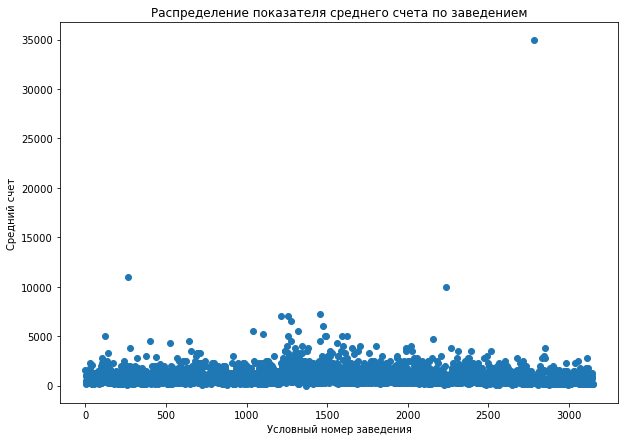

In [16]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['middle_avg_bill'].notna().sum())),
    y=df[df['middle_avg_bill'].notna()]['middle_avg_bill'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Средний счет')
plt.title('Распределение показателя среднего счета по заведением')
plt.show()

In [17]:
np.percentile(df[df['middle_avg_bill'].notna()]['middle_avg_bill'], 99)

3750.0

99% значений среднего чека не превышают 3750 руб.

Выведем заведения со средним чеком более 3750 руб.

In [18]:
df[df['middle_avg_bill'] > 3750]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
317,Vоdный,ресторан,"Москва, Ленинградское шоссе, 39, стр. 6",Северный административный округ,"ежедневно, 12:00–00:00",55.834978,37.479791,4.7,высокие,Средний счёт:4500–5500 ₽,5000.0,NaN,0,286.0
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
1125,На мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,NaN
1432,Il Barolo,ресторан,"Москва, Ленинградский проспект, 63",Северный административный округ,"ежедневно, 09:30–23:00",55.802775,37.519925,4.2,высокие,Средний счёт:3500–5000 ₽,4250.0,NaN,0,90.0
1765,КрабыКутабы,ресторан,"Москва, Лесная улица, 20, стр. 4",Центральный административный округ,"пн-чт 09:00–00:00; пт,сб 09:00–01:00; вс 09:00...",55.779654,37.591582,4.7,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,180.0
2795,Крошка Картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3038,Беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,NaN,0,150.0
3396,Марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3462,Uhvat,ресторан,"Москва, Рочдельская улица, 15с41",Центральный административный округ,"ежедневно, 12:00–00:00",55.755983,37.561909,4.7,высокие,Средний счёт:3000–5000 ₽,4000.0,NaN,0,NaN
3476,Маритим,ресторан,"Москва, Малая Грузинская улица, 23, стр. 1",Центральный административный округ,"ежедневно, 11:00–03:00",55.766043,37.571960,4.3,высокие,Средний счёт:от 5000 ₽,5000.0,NaN,0,187.0


Удалив все значения, мы потеряем часть важных данных. Поэтому найдем значения, которым нет логичного подтверждения и отредактируем их, разделив на 10. Строковые значения в столбце `avg_bill` редактировать не будем, поскольку далее они нам не понадобятся.

In [19]:
df.loc[[730, 2795, 7177], 'middle_avg_bill']

730     11000.0
2795     5500.0
7177    35000.0
Name: middle_avg_bill, dtype: float64

In [20]:
df.loc[[730, 2795, 7177], 'middle_avg_bill'] = df.loc[[730, 2795, 7177], 'middle_avg_bill']/10

Построим диаграмму распределения значений среднего счета после обработки аномальных значений.

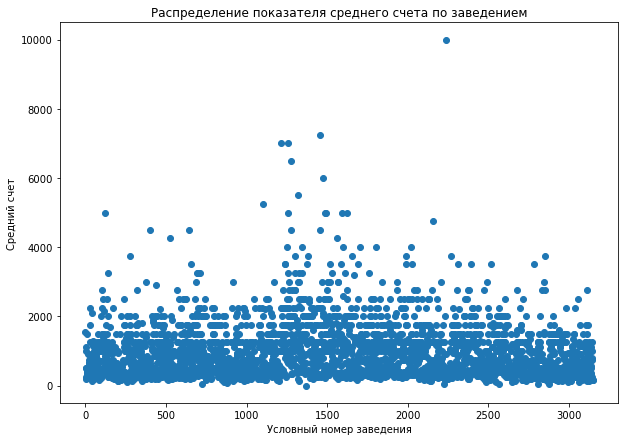

In [21]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['middle_avg_bill'].notna().sum())),
    y=df[df['middle_avg_bill'].notna()]['middle_avg_bill'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Средний счет')
plt.title('Распределение показателя среднего счета по заведением')
plt.show()

Средний счет без разбивки по категориям для большинства заведений составляет до 3000 руб.

Построим диаграмму распределения значений средней цены за чашку капучино.

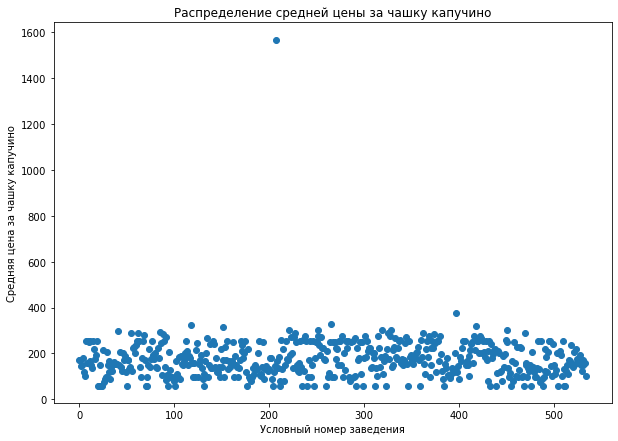

In [22]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['middle_coffee_cup'].notna().sum())),
    y=df[df['middle_coffee_cup'].notna()]['middle_coffee_cup'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Средняя цена за чашку капучино')
plt.title('Распределение средней цены за чашку капучино')
plt.show()

Найдем заведение с аномальным значением цены.

In [23]:
df[df['middle_coffee_cup'] == df['middle_coffee_cup'].max()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Посмотрим на медианную цену чашки капучино для кофеен "Шоколадница".

In [24]:
df[df['name'] == 'Шоколадница']['middle_coffee_cup'].median()

256.0

Вероятнее всего при заполнении поля `avg_bill` допущена ошибка. Цена чашки капучино составляет 230-290 р. Соответственно откорректируем среднее значение в столбце `middle_coffee_cup`.

In [25]:
df.loc[2859, 'middle_coffee_cup'] = np.mean([230, 290])

Построим диаграмму распределения значений средней цены за чашку капучино после обработки аномальных значений.

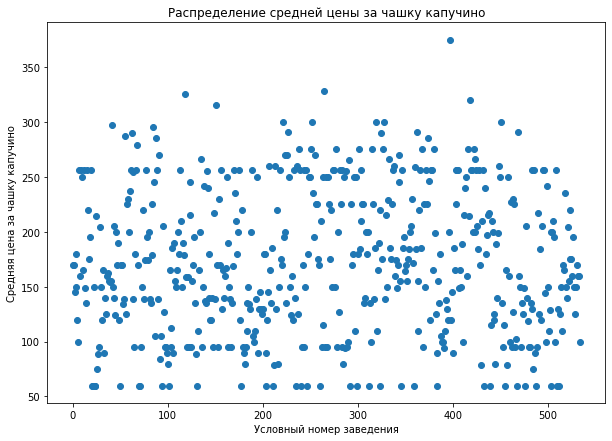

In [26]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['middle_coffee_cup'].notna().sum())),
    y=df[df['middle_coffee_cup'].notna()]['middle_coffee_cup'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Средняя цена за чашку капучино')
plt.title('Распределение средней цены за чашку капучино')
plt.show()

Средняя цена за чашку капучино без разбивки по категориям для большинства заведений составляет от 50 до 350 руб.

Построим диаграмму распределения количества посадочных мест.

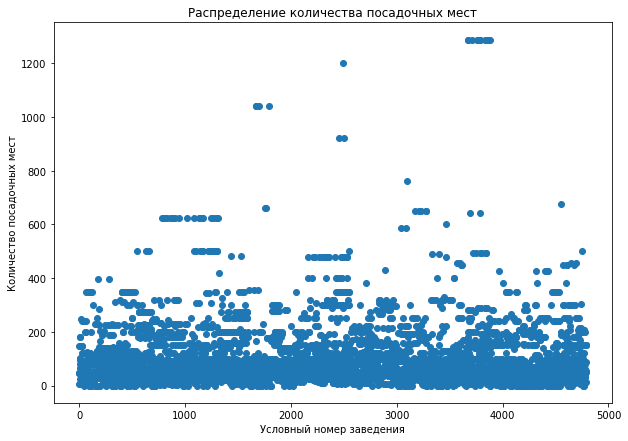

In [27]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['seats'].notna().sum())),
    y=df[df['seats'].notna()]['seats'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Распределение количества посадочных мест')
plt.show()

По графику можно отметить большое количество аномальных значений по количеству посадочных мест для заведений. Найдем 95 перцентиль для данного показателя.

In [28]:
np.percentile(df[df['seats'].notna()]['seats'], 95)

307.0

95% значений не превышают значение в 307 посадочных мест.

Обработаем аномальные значения по количеству посадочных мест более 307, таким образом мы сможем избежать большого искажения результатов исследования. 

Также отметим, что в датасете содержится большое количество заведений, расположенных на фудкортах, где количество посадочных мест указано для всего фудкорта.

In [29]:
df.loc[df['seats'] > np.percentile(df[df['seats'].notna()]['seats'], 95), 'seats'] = np.nan

Построим диаграмму распределения значений количества посадочных мест после обработки аномальных значений.

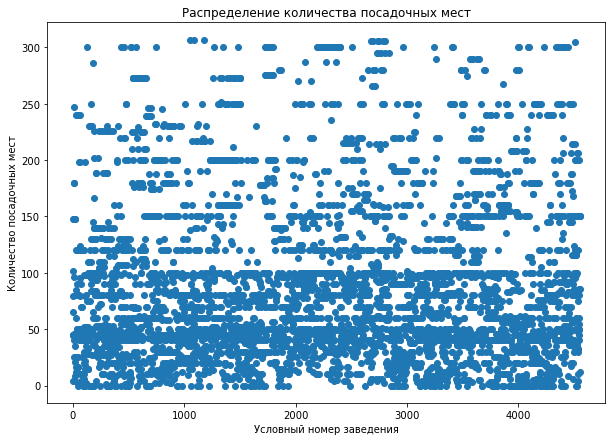

In [30]:
plt.figure(figsize=(10,7))
plt.scatter(
    x=pd.Series(range(df['seats'].notna().sum())),
    y=df[df['seats'].notna()]['seats'])
plt.xlabel('Условный номер заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Распределение количества посадочных мест')
plt.show()

В большинстве заведений датасета вмещается до 100 посадочных мест.

Добавим в датасет столбец `street` с названием улицы, на которой расположено заведение.

In [31]:
df['street'] = df.address.apply(lambda x: x.split(', ', maxsplit=2)[1])

Создадим столбец `is_24/7` с обозначением `True`, если заведение работает ежедневно и круглосуточно.

In [32]:
df['is_24/7'] = (df['hours'].str.contains('ежеднев')) & (df['hours'].str.contains('круглосут'))

Для упрощения работы с датафреймом представим длинные названия округов Москвы в виде акронимов. Создадим столбец `acr_district`. Для этого зададим функцию `acronym`, которая преобразует строку в акроним.

In [33]:
# функция на вход принимает строку, разделяет ее на отдельные слова, для каждого слова берет первую букву
# и соединяет их, делая все буквы прописными
def acronym(string):
    letters = [word[0] for word in re.split('\W+', string)]
    result = ''.join(letters).upper()
    return result

Применим заданную функцию к столбцу `district`.

In [34]:
df['acr_district'] = df['district'].apply(acronym)

Проверим, какую часть датасета мы потеряли в результате предобработки данных.

In [35]:
print(f'В результате предобработки утрачено {round(((1-len(df)/old_df)*100), 2)}% данных')

В результате предобработки утрачено 0.04% данных


**Вывод:**

При предобработке данных удалены неявные дубликаты строк, обработаны аномальные значения в столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats`. Датасет дополнен столбцом `street` с указанием улицы, на котором расположено заведение и столбцом `is_24/7` с указанием True, если заведение работает круглосуточно. Также добавлен столбец `acr_district` с акронимами названий округов.

В результате предобработки утрачено 0.04% данных, что является допустимым.

## Анализ данных

Выполним анализ данных:
- Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и т. д.
- Исследуем количество посадочных мест в местах по категориям заведений.
- Рассмотрим соотношение сетевых и несетевых заведений в датасете.
- Найдем топ-15 популярных сетей в Москве.
- Найдем общее количество заведений и количество заведений каждой категории по районам.
- Посмотрим на распределение средних рейтингов по категориям заведений.
- Найдем топ-15 улиц по количеству заведений. Рассмотрим распределение количества заведений и их категорий по этим улицам.
- Посчитаем медианный средний чек для каждого района.
- Проанализируем зависимость цен от округа расположения заведения.

Посмотрим, какие категории заведений представлены в данных и в каком количестве. Сразу найдем количество сетевых и несетевых заведений для каждой категории и средний рейтинг.

In [36]:
cnt_by_cat = (
    df.groupby('category', as_index=False).agg({'name':'count', 'rating':'mean'})
    .rename(columns={'name':'count_vals'})
    .sort_values('count_vals', ascending=False).reset_index(drop=True)
)
cnt_by_cat['rating'] = round(cnt_by_cat['rating'], 2)
cnt_by_cat

,category,count_vals,rating
0,кафе,2377,4.12
1,ресторан,2042,4.29
2,кофейня,1413,4.28
3,"бар,паб",764,4.39
4,пиццерия,633,4.30
5,быстрое питание,603,4.05
6,столовая,315,4.21
7,булочная,256,4.27


Т.к. нам необходимо будет строить много графиков с разбивкой по категориям заведений, для лучшего восприятия данных зададим каждой категории свой цвет.

In [37]:
cats = {'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая'}
category_color = {i: px.colors.qualitative.Set2[k] for i,k in zip(cats, range(len(cats)))}

Построим круговую диаграмму для визуализации.

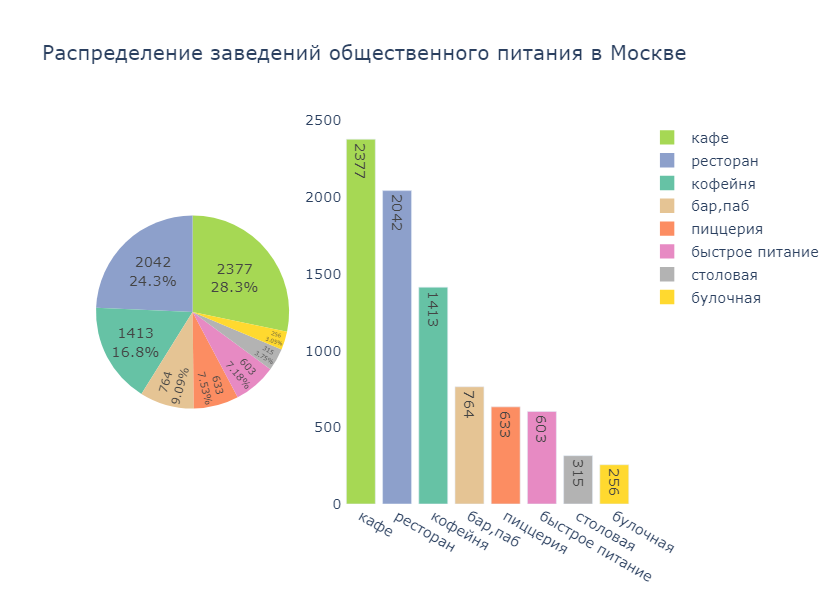

In [38]:
# Создаем сетку для вывода графиков, указываем тип графика и ширину столбцов для каждой ячейки. Также выводим название
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'bar'}]], column_widths=[0.4, 0.6])
fig.update_layout(title_text = 'Распределение заведений общественного питания в Москве', plot_bgcolor='white')

# Создаем круговую диаграмму
fig1 = px.pie(cnt_by_cat, values='count_vals', names='category', color='category', color_discrete_map=category_color, 
              width = 900)
# Создаем столбчатую диаграмму. Чтобы легенда не дублировалась, прописываем параметр showlegend=False)
fig2 = go.Bar(x=cnt_by_cat['category'], y=cnt_by_cat['count_vals'], text=cnt_by_cat['count_vals'], showlegend=False)

# Для круговой диаграммы задаем параметры подписей секторов
fig1.update_traces(textposition='inside', textinfo='percent+value')

# Добавляем диаграммы на сетку
fig.add_trace(fig2, row=1, col=2)
fig.update_traces(marker=dict(color = list(map((lambda x: category_color[x]), cnt_by_cat['category']))))
fig.add_trace(fig1['data'][0], row=1, col=1)
fig.show()

По построенным графикам видно, что датасет преимущественно представлен заведениями типа кафе (28.3%) и ресторан (24.3%), чуть менее кофейня (16.8%). Меньшую долю имеют бар, паб (9.1%), пиццерия (7.53%), быстрое питание (7.17%), столовая (3.75%) и булочная (3.05%).

Сравним заведения по количеству посадочных мест. Для сравнения будем пользоваться медианными значениями для каждого типа заведений, чтобы заведения, расположенные на фудкортах с большим количеством посадочных мест не вызывали сильный перекос.

In [39]:
seats_by_cat = df[df['seats'] > 0].groupby('category', as_index=False)['seats'].median()\
         .rename(columns={'seats':'median_seats'}).sort_values('median_seats', ascending=False).reset_index(drop=True)
seats_by_cat

,category,median_seats
0,ресторан,81.0
1,"бар,паб",80.0
2,кофейня,75.5
3,столовая,75.0
4,быстрое питание,70.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,50.0


Построим столбчатую диаграмму.

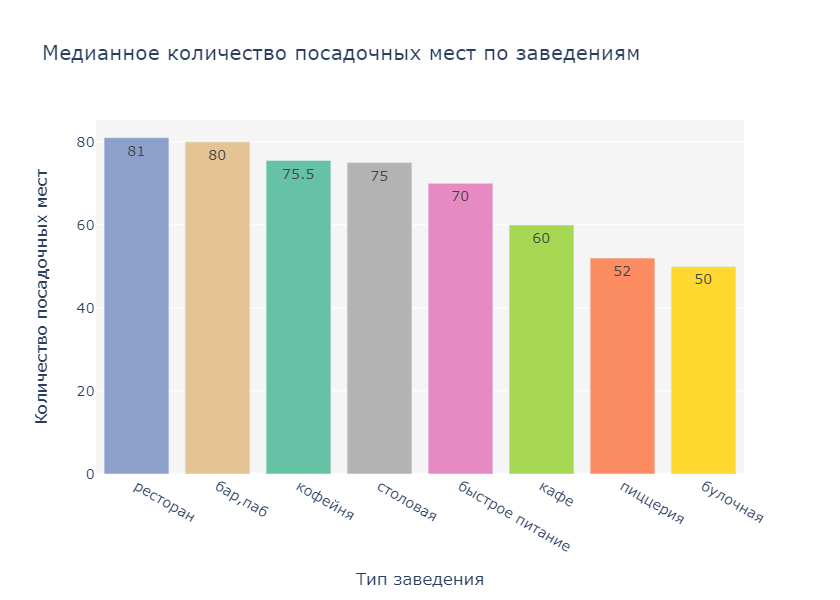

In [40]:
fig = px.bar(
    seats_by_cat, x='category', y='median_seats', title='Медианное количество посадочных мест по заведениям',
    labels=dict(category='Тип заведения', median_seats='Количество посадочных мест'), color='category', text='median_seats',
    color_discrete_map=category_color
)
fig.update_layout(plot_bgcolor='whitesmoke', showlegend=False)
fig.show()

Наибольшее медианное количество посадочных мест у заведений типа ресторан (81) и бар, паб (80). Далее идут кофейня (75.5) и столовая (75). Заведения быстрого питания в среднем имеют 70 посадочных мест, для кафе - 60. Меньше всего посадочных мест имеют пиццерии (52) и булочной (50).

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

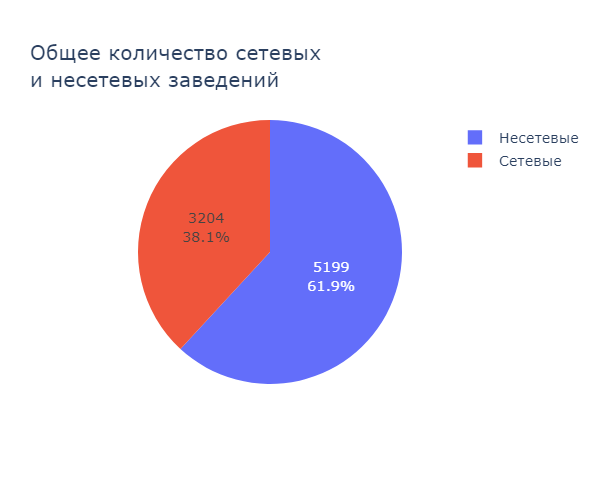

In [41]:
fig = go.Figure()
fig.add_trace(go.Pie(labels=df['chain'].replace({1:'Сетевые', 0:'Несетевые'})))
fig.update_layout(title='Общее количество сетевых<br>и несетевых заведений', height=400, width=500)
fig.update_traces(marker=dict(colors=[['#636EFA'], ['#EF553B']]), textinfo='percent+value')
fig.show()

Несетевых заведений в датасете больше. 62% несетевых против 38% сетевых.

Посмотрим отношение сетевых и несетевых заведений общественного питания с разбивкой по категориям.

In [42]:
# Группируем данные
cat_by_chain = df.groupby(['category', 'chain'], as_index=False)['name'].count().rename(columns={'name':'count'})
# Заменим значения (0 на Несетевые, 1 на Сетевые)
cat_by_chain['chain'] = cat_by_chain['chain'].replace({0:'Несетевые', 1:'Сетевые'})
# Сортируем значения по общему количеству заведений в категории
cat_by_chain.index = cat_by_chain.groupby('category')['count'].transform(sum)
cat_by_chain = cat_by_chain.sort_index(ascending=False).reset_index(drop=True)
# Добавим столбец с указанием доли сетевых и несетевых для каждой категории
cat_by_chain['ratio'] = round(cat_by_chain['count'] / cat_by_chain.groupby('category')['count'].transform(sum) * 100, 2)
cat_by_chain['ratio'] = cat_by_chain['ratio'].astype(str) + '%'
cat_by_chain

,category,chain,count,ratio
0,кафе,Несетевые,1598,67.23%
1,кафе,Сетевые,779,32.77%
2,ресторан,Несетевые,1312,64.25%
3,ресторан,Сетевые,730,35.75%
4,кофейня,Несетевые,693,49.04%
5,кофейня,Сетевые,720,50.96%
6,"бар,паб",Несетевые,596,78.01%
7,"бар,паб",Сетевые,168,21.99%
8,пиццерия,Несетевые,303,47.87%
9,пиццерия,Сетевые,330,52.13%


Визуализируем подготовленные данные с помощью столбчатой диаграммы.

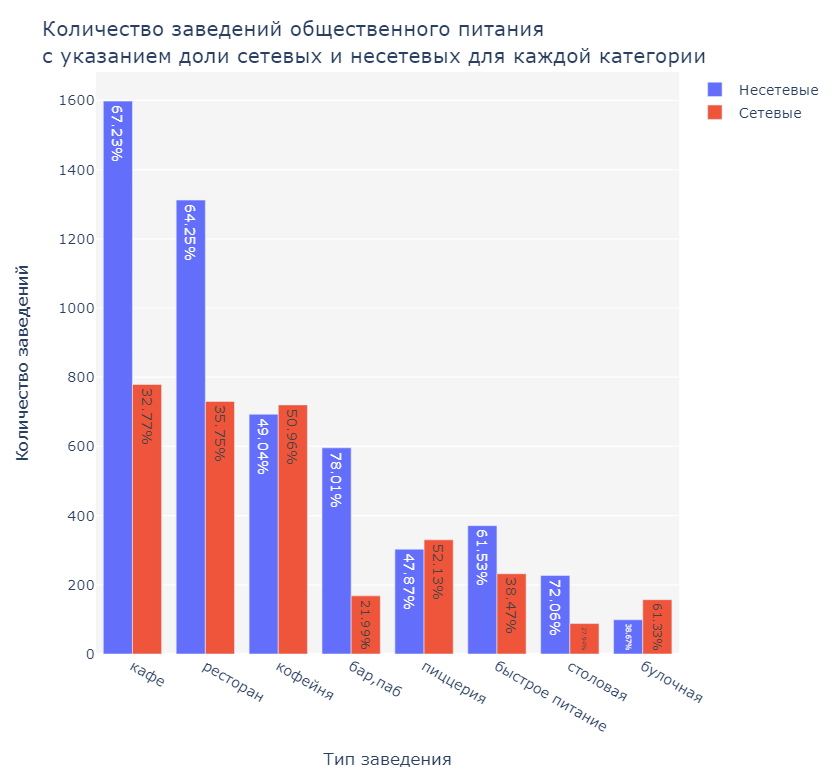

In [43]:
fig = px.bar(
    cat_by_chain, x='category', y='count',
    labels=dict(chain=''), color='chain', text='ratio'
)
fig.update_layout(
    plot_bgcolor='whitesmoke', 
    title='Количество заведений общественного питания<br>с указанием доли сетевых и несетевых для каждой категории', 
    yaxis_title='Количество заведений', xaxis_title='Тип заведения', height=650, barmode='group'
)
fig.update_traces(textposition='inside')
fig.show()

Чаще всего сетевыми являются булочные (61.3%), пиццерии (52.1%) и кофейни(51%). Реже всего - заведения типа бар, паб (22.1%) и столовые (27.9%).

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Также при группировке создадим столбец `chain_cnt`, который будет показывать количество сетевых заведений для каждого имени. Это понадобится для того, чтобы убедиться в том, что в нашу таблицу не попали несетевые заведения.

In [44]:
df.groupby('name').agg({'name':'count', 'chain':'sum'})\
.rename(columns={'name':'count', 'chain':'chain_cnt'}).sort_values('count',ascending=False).head(15)

,count,chain_cnt
name,,
Кафе,189,0
Шоколадница,120,120
Домино'с Пицца,76,76
Додо Пицца,74,74
One Price Coffee,71,71
Яндекс Лавка,69,69
Cofix,65,65
Prime,50,50
Хинкальная,44,44


Среди сгруппированных заведений видим такие позиции как: Кафе, Шаурма, Ресторан, куда попали несетевые заведения с одинаковыми названиями в датасете. Исключим эти позиции из сгруппированного датафрейма. Запишем сгруппированный датафрейм в переменную `top_15`.

In [45]:
top_15 = (
    df.groupby('name').agg({'category':'max','name':'count', 'chain':'sum'})
    .rename(columns={'name':'count', 'chain':'chain_cnt'})
    .query('chain_cnt != 0').sort_values('count',ascending=False)
    .reset_index()
    .head(15)
)
top_15

,name,category,count,chain_cnt
0,Шоколадница,кофейня,120,120
1,Домино'с Пицца,пиццерия,76,76
2,Додо Пицца,пиццерия,74,74
3,One Price Coffee,кофейня,71,71
4,Яндекс Лавка,ресторан,69,69
5,Cofix,кофейня,65,65
6,Prime,ресторан,50,50
7,Хинкальная,столовая,44,44
8,КОФЕПОРТ,кофейня,42,42
9,Кулинарная лавка братьев Караваевых,кафе,39,39


По популярности с большим отрывом лидирует кофейня Шоколадница с количеством 120 заведений в Москве. 2 и 3 место в топе занимают пиццерии Домино'с Пицца (76 заведений) и Додо Пицца (74).

Визуализируем данные с помощью диаграммы `sunburst`.

In [46]:
top_15

,name,category,count,chain_cnt
0,Шоколадница,кофейня,120,120
1,Домино'с Пицца,пиццерия,76,76
2,Додо Пицца,пиццерия,74,74
3,One Price Coffee,кофейня,71,71
4,Яндекс Лавка,ресторан,69,69
5,Cofix,кофейня,65,65
6,Prime,ресторан,50,50
7,Хинкальная,столовая,44,44
8,КОФЕПОРТ,кофейня,42,42
9,Кулинарная лавка братьев Караваевых,кафе,39,39


C:\Users\darkt\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\darkt\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



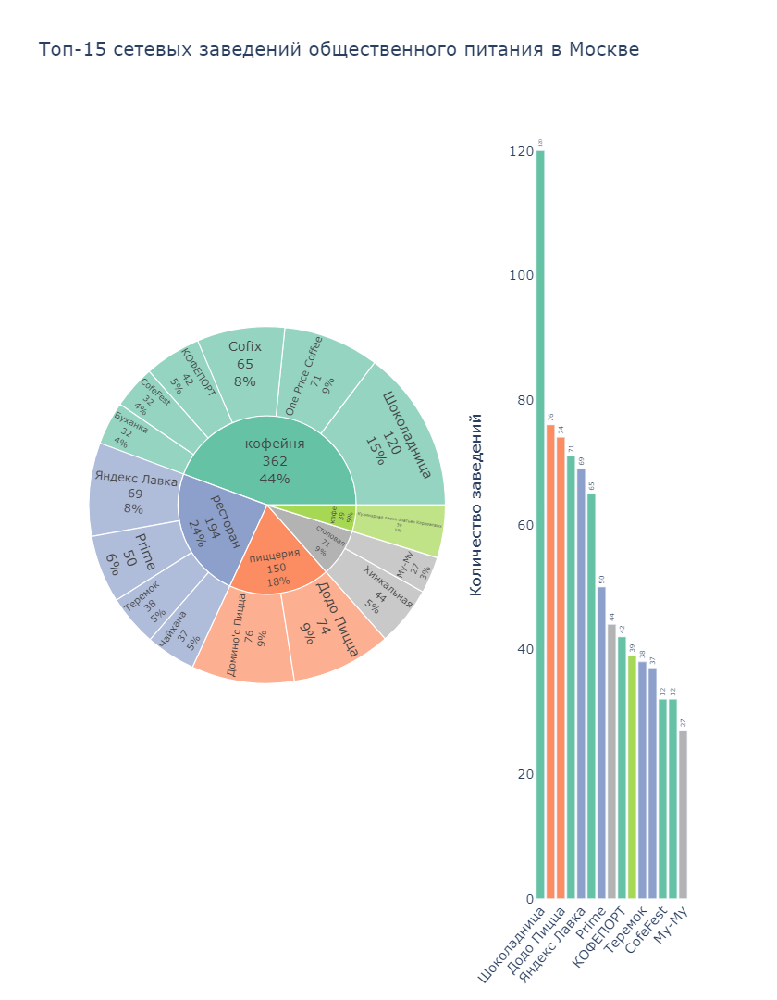

In [47]:
# Создаем сетку для вывода графиков, указываем тип графика и ширину столбцов для каждой ячейки. Также выводим название
fig = make_subplots(
    rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'bar'}]], column_widths=[0.7, 0.3], horizontal_spacing=0.15
)
fig.update_layout(title_text = 'Топ-15 сетевых заведений общественного питания в Москве', height=900,\
                  plot_bgcolor='white', yaxis_title='Количество заведений', xaxis_tickangle=-50)

# Создаем круговую диаграмму
fig1 = px.sunburst(top_15, path=['category', 'name'], values='count', color='category', color_discrete_map=category_color)
# Создаем столбчатую диаграмму. Чтобы легенда не дублировалась, прописываем параметр showlegend=False)
fig2 = go.Bar(x=top_15['name'], y=top_15['count'], text=top_15['count'], showlegend=False)

# Для круговой диаграммы задаем параметры подписей секторов
fig1.update_traces(textinfo='label+value+percent root')

# Добавляем диаграммы на сетку
fig.add_trace(fig2, row=1, col=2)
fig.update_traces(marker=dict(color = list(map((lambda x: category_color[x]), top_15['category']))), textangle=-90,\
                  textposition='outside')
fig.add_trace(fig1['data'][0], row=1, col=1)
fig.show()

Среди 15 самых популярных заведений Москвы большую долю занимают кофейни (44%), менее рестораны (24%) и пиццерии (18%).

Посмотрим на количество заведений по округам и категориям. Сгруппированные данные запишем в переменную `cnt_by_dis`.

In [48]:
cnt_by_dis = df.groupby(['acr_district', 'category'])['name'].count().to_frame().reset_index().rename(columns={'name':'count'})

# Отортируем значения по общему количеству заведений в категории
cnt_by_dis.index = cnt_by_dis.groupby('acr_district')['count'].transform(sum)
cnt_by_dis = cnt_by_dis.sort_index(ascending=False).reset_index(drop=True)
cnt_by_dis

,acr_district,category,count
0,ЦАО,булочная,50
1,ЦАО,быстрое питание,87
2,ЦАО,кафе,464
3,ЦАО,кофейня,428
4,ЦАО,пиццерия,113
...,...,...,...
67,СЗАО,кафе,115
68,СЗАО,быстрое питание,30
69,СЗАО,булочная,12
70,СЗАО,"бар,паб",23


Также создадим отдельный датафрейм с общим количеством заведений для каждого округа. Это пригодится нам при визуализации.

In [49]:
cnt_by_dis2 = cnt_by_dis.groupby('acr_district')['count'].sum().to_frame()

Построим столбчатую диаграмму распределения заведений по округам. Разным цветом покажем категории заведений для каждого округа.

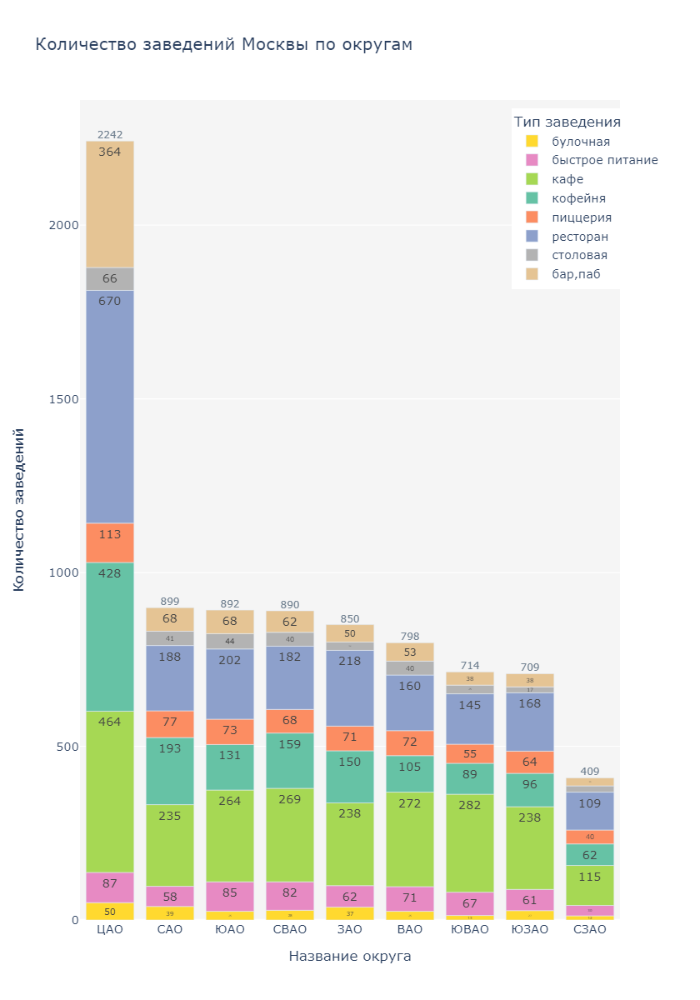

In [50]:
fig = px.bar(cnt_by_dis, x='acr_district', y='count', color='category',
             height=1000,
             title='Количество заведений Москвы по округам',
             text='count', color_discrete_map=category_color)
fig.update_layout(legend=dict(yanchor='top', y=0.99, xanchor='left', x=0.80, title='Тип заведения'),\
                  yaxis_title='Количество заведений', xaxis_title='Название округа', plot_bgcolor='whitesmoke')
fig.update_traces(textposition='inside')
fig.add_trace(go.Scatter(
    x=cnt_by_dis2.index, y=cnt_by_dis2['count'],
    text=cnt_by_dis2['count'], mode='text', textposition='top center',
    textfont=dict(size=14, color='slategrey'), showlegend=False
))

fig.show()

По количеству заведений на округ можно сделать следующие выводы:
- абсолютным лидером по количеству заведений общественного питания является ЦАО (2242 заведения)
- среди остальных регионов лидируют САО (899 заведений), ЮАО (892) и СВАО (890)
- самый низкий показатель у СЗАО (409 заведений)

В целом наблюдается одинаковое распределение по типам заведений внутри округов.

Визуализируем распределение средних рейтингов по категориям заведений из ранее созданного датафрейма `cnt_by_cat`.

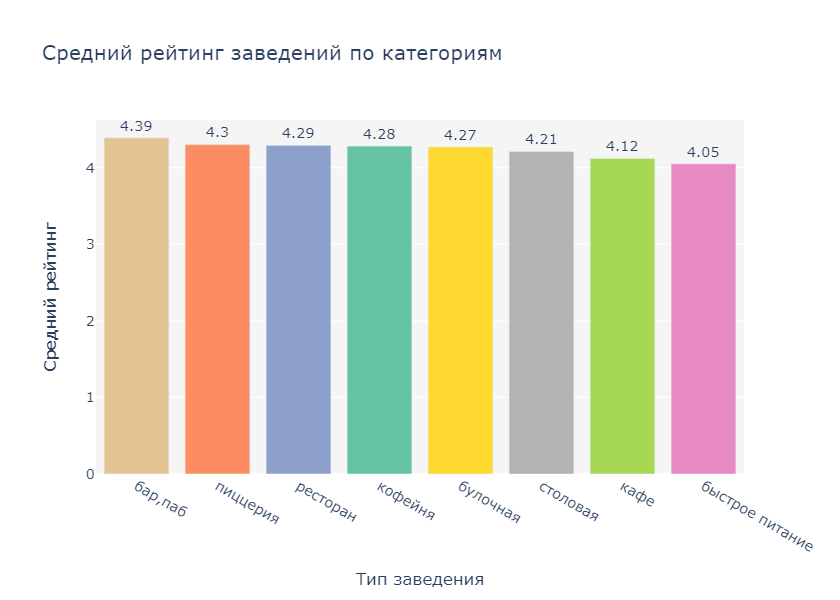

In [51]:
fig = px.bar(
    cnt_by_cat.sort_values('rating', ascending=False), x='category', y='rating',
    title='Средний рейтинг заведений по категориям', labels=dict(category='Тип заведения', rating='Средний рейтинг'),
    color='category', text='rating', color_discrete_map=category_color
)
fig.update_layout(plot_bgcolor='whitesmoke', showlegend=False)
fig.update_traces(textposition='outside')
fig.show()

Самый высокий средний рейтинг имеют бары, пабы (4.39). Самый низкий - заведения быстрого питания (4.05) и кафе (4.12). Рестораны, кофейни, пиццерии, столовые и булочные имеют среднийрейтинг в пределах 4.21-4.3.

Разница между максимальным и минимальным средним рейтингом в зависимости от типа заведения незначительная, всего 0.34 балла по пятибальной шкале.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, возьмем из файла `admin_level_geomap.geojson`.

Отобразим все заведения датасета на карте с помощью кластеров.

Сгруппируем датафрейм по округам и посчитаем средний рейтинг для каждого округа. Сохраним эти данные в переменную `rating_by_dist`.

In [52]:
cnt_by_dis = df.groupby('district', as_index=False)['rating'].mean()
cnt_by_dis

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [53]:
# Подключаем модуль для работы с JSON-форматом и модуль urllib.request для загрузки файла, если он отсутствует локально
import json
import urllib.request

# Читаем файл и сохраняем в переменной
try:
    with open('datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    with urllib.request.urlopen('https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson') as f:
        geo_json = json.load(f)

In [54]:
# Загружаем JSON-файл с границами округов Москвы
state_geo = geo_json
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cnt_by_dis,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Выводим карту
m

По выведенному хороплету можно сделать вывод о том, что самый высокий средний рейтинг у заведений, расположенных в Центральном административном округе (4.38), чуть ниже в Северном административном округе (4.24). Самый низкий в Юго-восточном (4.1).

Отобразим все заведения датасета на карте с помощью кластеров.

In [55]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Сгруппируем датасет по названиям улиц и найдем топ-15 улиц с наибольшим количеством заведений общепита.

In [56]:
top_15_st = (
    df.groupby('street', as_index=False)['name'].count()
    .rename(columns={'name':'count'})
    .sort_values('count', ascending=False)
    .head(15)
)
top_15_st

,street,count
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Теперь для каждой из этих улиц посчитаем количество заведений по группам.

In [57]:
top_15_st_cat = df.query('street in list(@top_15_st.street)').groupby(['street', 'category'], as_index=False)['name'].count()
top_15_st_cat = top_15_st_cat.rename(columns={'name':'count'})

# Отортируем значения по общему количеству заведений в категории
top_15_st_cat.index = top_15_st_cat.groupby('street')['count'].transform(sum)
top_15_st_cat = top_15_st_cat.sort_index(ascending=True).reset_index(drop=True)
top_15_st_cat

,street,category,count
0,Пятницкая улица,быстрое питание,2
1,Пятницкая улица,"бар,паб",9
2,Пятницкая улица,булочная,3
3,Пятницкая улица,кафе,7
4,Пятницкая улица,кофейня,6
...,...,...,...
106,проспект Мира,кафе,53
107,проспект Мира,быстрое питание,21
108,проспект Мира,"бар,паб",11
109,проспект Мира,ресторан,45


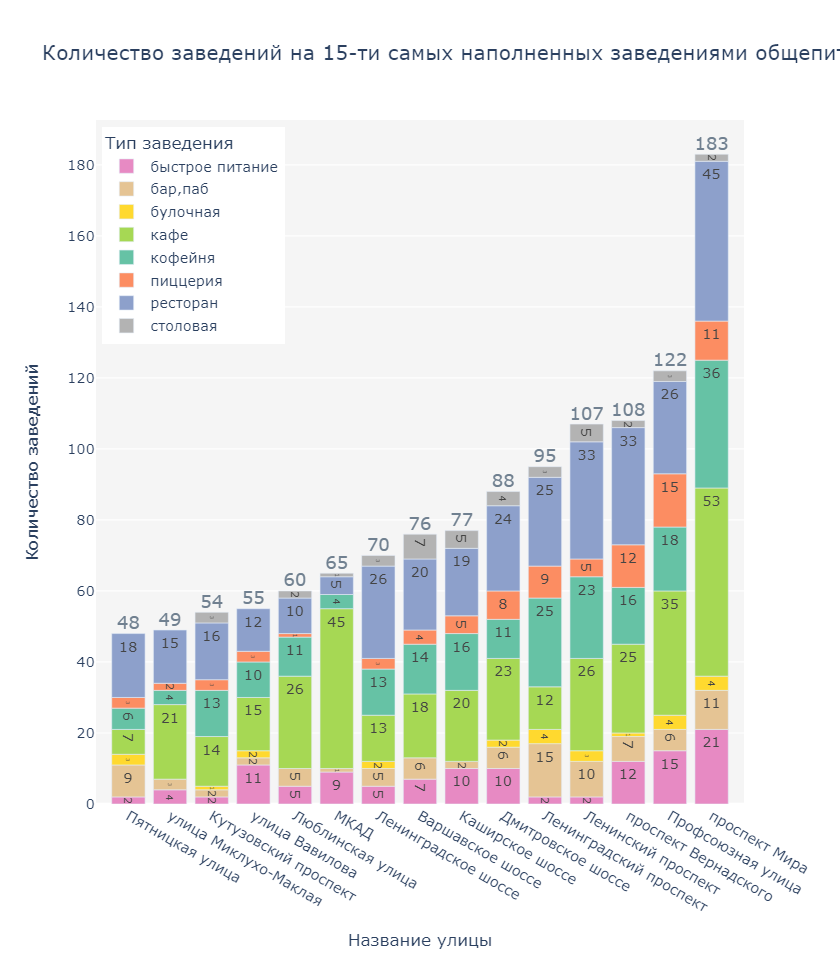

In [58]:
fig = px.bar(top_15_st_cat, x='street', y='count', color='category',
             height=800, color_discrete_map=category_color,
             title='Количество заведений на 15-ти самых наполненных заведениями общепита улицах',
             text='count')
fig.update_layout(legend=dict(yanchor='top', y=0.99, xanchor='left', x=0.01, title='Тип заведения'),\
                  yaxis_title='Количество заведений', xaxis_title='Название улицы', plot_bgcolor='whitesmoke')
fig.update_traces(textposition='inside')
fig.add_trace(go.Scatter(
    x=top_15_st.street, y=top_15_st['count'],
    text=top_15_st['count'], mode='text', textposition='top center',
    textfont=dict(size=15, color='slategrey'), showlegend=False
))

fig.show()

Самой популярной улицей для открытия заведений общепита является проспект Мира, на котором располагается 183 заведения, меньше на Профсоюзной улице (122), проспекте Вернадского (108), Ленинском проспекте (107) и Ленинградском проспекте (95). На остальных улицах из списка топ-15 количество заведений находится в пределах 48-95 штук.

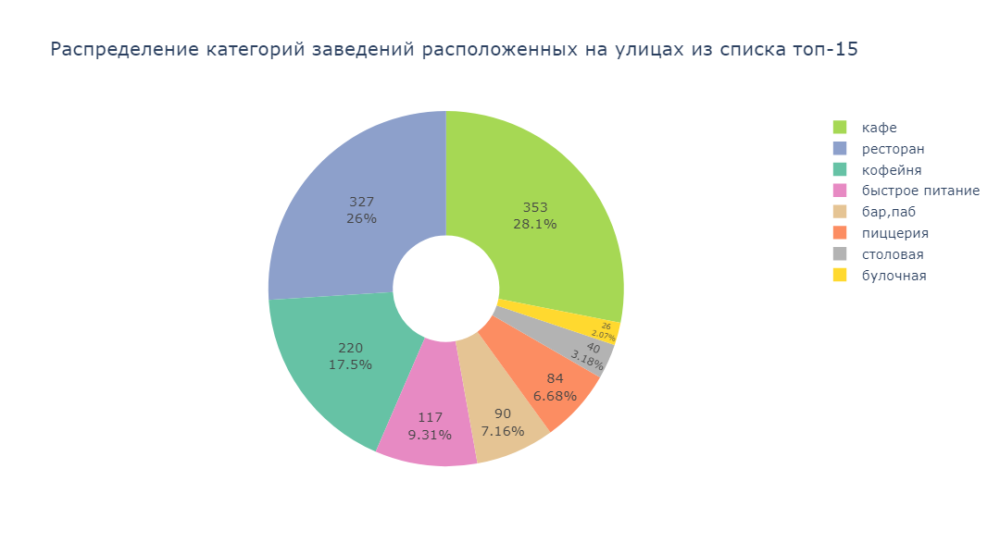

In [59]:
fig = px.pie(top_15_st_cat, values='count', names='category', color='category', color_discrete_map=category_color,
             title='Распределение категорий заведений расположенных на улицах из списка топ-15', width = 900, hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+value')
fig.show()

Распределение категорий заведений расположенных на улицах из списка топ-15 аналогично их общему распределению по Москве.

Найдем улицы, на которых находится только один объект общепита.

In [60]:
one_obj = df.groupby('street', as_index=False)['name'].count().rename(columns={'name':'count'})\
.sort_values('count', ascending=False).query('count == 1')
one_obj

,street,count
1421,улица Фотиевой,1
1418,улица Фадеева,1
1233,улица Кирпичные Выемки,1
1092,сад Эрмитаж,1
1220,улица Ивана Франко,1
...,...,...
709,Павелецкая набережная,1
712,Панкратьевский переулок,1
716,Парусный проезд,1
717,Певческий переулок,1


Всего таких заведений 458 штук.

Теперь отфильтруем датафрейм и найдем заведения, которые расположены на этих улицах. Сгруппируем их по категориям и составим небольшой датафрейм с описанием основных показателей.

In [61]:
describe = ['min', 'mean', 'max']
(
    df.query('street in @one_obj.street').groupby('category')
    .agg({'name':'count', 'rating':describe, 'middle_avg_bill':describe, 'seats':describe})
)

name rating                middle_avg_bill               \
                count    min      mean  max             min         mean   
category                                                                   
бар,паб            39    3.9  4.479487  5.0           650.0  1458.333333   
булочная            8    3.8  4.337500  4.9             NaN          NaN   
быстрое питание    23    3.0  4.082609  5.0           125.0   680.555556   
кафе              160    1.4  4.133750  5.0            67.0   654.312500   
кофейня            84    3.2  4.307143  5.0           175.0   568.333333   
пиццерия           15    4.1  4.373333  4.9           255.0   785.500000   
ресторан           93    1.0  4.246237  5.0           175.0  1707.142857   
столовая           36    3.0  4.261111  4.9           200.0   283.043478   

                        seats                    
                    max   min       mean    max  
category                                         
бар,паб          4500.0  22.0  66.000000  200.0  
булочная            NaN   0.0  59.600000  240.0  
быстрое питание  2750.0   0.0  47.428571  220.0  
кафе             2000.0   0.0  44.978723  180.0  
кофейня          1450.0   0.0  47.166667  150.0  
пиццерия         1500.0   6.0  59.888889  240.0  
ресторан         7000.0   0.0  71.428571  220.0  
столовая          400.0  27.0  83.285714  180.0

Для сравнения создадим такой же датафрейм по заведениям, находящихся на наиболее наполненных заведениями улицах из ранее составленного списка топ-15.

In [62]:
(
    df.query('street in @top_15_st_cat.street').groupby('category')
    .agg({'name':'count', 'rating':describe, 'middle_avg_bill':describe, 'seats':describe})
)

name rating                middle_avg_bill               \
                count    min      mean  max             min         mean   
category                                                                   
бар,паб            90    1.4  4.301111  4.9           190.0  1275.340909   
булочная           26    3.1  4.265385  4.9           240.0   468.750000   
быстрое питание   117    1.1  4.045299  5.0           140.0   428.846154   
кафе              353    1.0  4.099150  5.0           100.0   812.313953   
кофейня           220    2.3  4.234091  5.0            50.0   643.148148   
пиццерия           84    2.5  4.251190  4.9           250.0   862.129630   
ресторан          327    1.0  4.287768  5.0           225.0  1265.142077   
столовая           40    3.5  4.210000  4.9           175.0   476.578947   

                        seats                     
                    max   min        mean    max  
category                                          
бар,паб          2500.0  20.0  114.491803  306.0  
булочная          900.0  10.0  117.111111  290.0  
быстрое питание  1200.0   5.0  129.111111  306.0  
кафе             4500.0   0.0  100.383234  306.0  
кофейня          2250.0   0.0  109.152000  306.0  
пиццерия         3000.0   0.0  113.530612  273.0  
ресторан         5000.0   0.0  116.978261  306.0  
столовая         3750.0   9.0   91.240000  268.0

Для упрощения написания промежуточного вывода введем 2 типа заведений:
- тип А - заведения, расположенные на улицах, общее количество заведений общепита на которых равно 1,
- тип В - заведения, расположенные на улицах, входящих в список топ-15 по количеству расположенных на них заведений общепита.

Сравнив 2 приведенных выше датафрейма можно отметить, что для заведений типа А среднее количество посадочных мест практически всех категорий ниже приблизительно на 50% раза по отношению к заведениям типа В, за исключением столовых, где количество посадочных мест заведений типа А ниже количества посадочных мест заведений типа В приблизительно на 10%.

Это может говорить о том, что заведения типа А расположены на улицах с маленьким количеством трафика и в не самых доступных для посетителей местах.

По другим рассмотренным показателям нет явно выраженных различий между заведениями типа А и В.

Найдем медианный средний чек для каждого раойна.

In [63]:
avg_bill_by_dis = df.groupby('district', as_index=False)['middle_avg_bill'].median()\
                    .rename(columns={'middle_avg_bill':'median_avg_bill'}).sort_values('median_avg_bill', ascending=False)
avg_bill_by_dis

,district,median_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [64]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.9, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_by_dis,
    columns=['district', 'median_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.5,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самый большой медианный средний чек по заведениям в ЦАО (1000 руб.) и ЗАО (1000 руб.). Самый низкий показатель имеют ЮВАО (450 руб.), ЮАО (500 руб.) и СВАО (500 руб.). По чему можно сделать вывод, что средний чек в целом зависит от удаленности заведения от центра.

Посмотрим на распределение заведений в Москве по времени работы (круглосуточные и некруглосуточные).

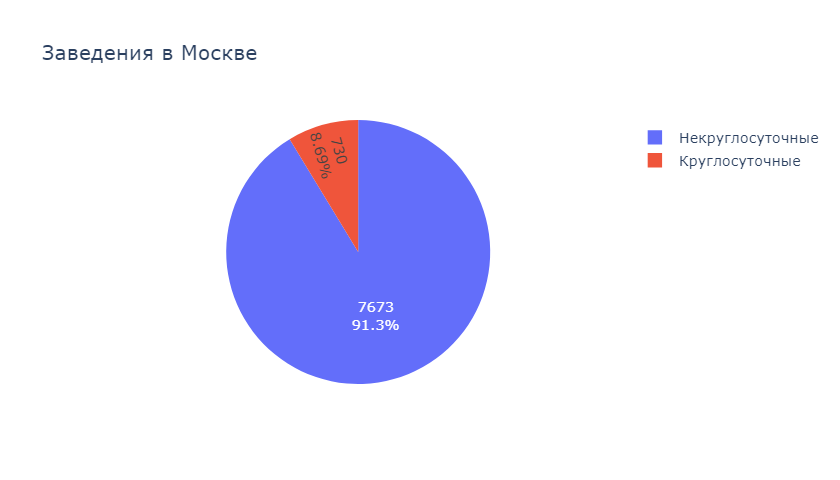

In [65]:
fig = go.Figure()
fig.add_trace(go.Pie(labels=df['is_24/7'].replace({False:'Некруглосуточные', True:'Круглосуточные'})))
fig.update_layout(title='Заведения в Москве', height=400, width=700)
fig.update_traces(textinfo='percent+value')
fig.show()

Среди всех заведений всего 8.69% работают круглосуточно.

Посмотрим на долю круглосуточных заведений с разбивкой по категориям. Для этого сгруппируем заведения по категориям и режиму работы, посчитаем количество и долю.

In [66]:
# Группируем данные
cat_by_24 = df.groupby(['category', 'is_24/7'], as_index=False)['name'].count().rename(columns={'name':'count'})
# Заменим значения (False на Некруглосуточные, True на Круглосуточные)
cat_by_24['is_24/7'] = cat_by_24['is_24/7'].replace({False:'Некруглосуточные', True:'Круглосуточные'})
# Сортируем значения по общему количеству заведений в категории
cat_by_24.index = cat_by_24.groupby('category')['count'].transform(sum)
cat_by_24 = cat_by_24.sort_index(ascending=False).reset_index(drop=True)
# Добавим столбец с указанием доли круглосуточных и некруглосуточных для каждой категории
cat_by_24['ratio'] = round(cat_by_24['count'] / cat_by_24.groupby('category')['count'].transform(sum) * 100, 2)
cat_by_24['ratio'] = cat_by_24['ratio'].astype(str) + '%'
cat_by_24 = cat_by_24.rename(columns=({'is_24/7':'time'}))
cat_by_24

,category,time,count,ratio
0,кафе,Некруглосуточные,2110,88.77%
1,кафе,Круглосуточные,267,11.23%
2,ресторан,Некруглосуточные,1907,93.39%
3,ресторан,Круглосуточные,135,6.61%
4,кофейня,Некруглосуточные,1354,95.82%
5,кофейня,Круглосуточные,59,4.18%
6,"бар,паб",Некруглосуточные,712,93.19%
7,"бар,паб",Круглосуточные,52,6.81%
8,пиццерия,Некруглосуточные,602,95.1%
9,пиццерия,Круглосуточные,31,4.9%


Визуализируем данные.

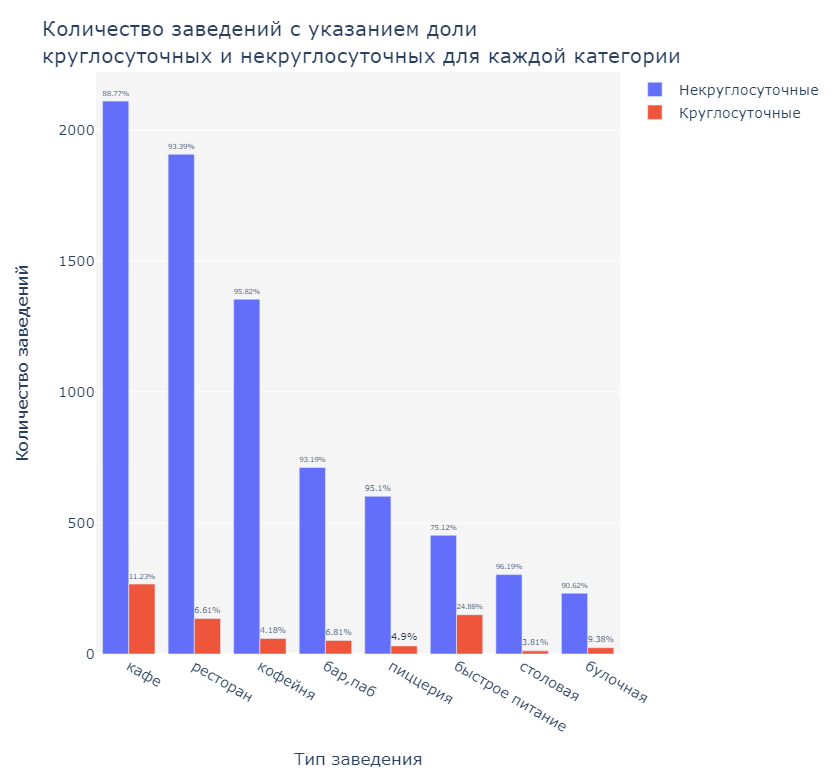

In [67]:
fig = px.bar(
    cat_by_24, x='category', y='count',
    color='time', text='ratio', labels=dict(time='')
)
fig.update_layout(
    plot_bgcolor='whitesmoke', 
    title='Количество заведений с указанием доли<br>круглосуточных и некруглосуточных для каждой категории', 
    yaxis_title='Количество заведений', xaxis_title='Тип заведения', height=650, barmode='group'
)
fig.update_traces(textposition='outside')
fig.show()

Наибольшая доля круглосуточных среди заведений быстрого питания (24.88%), кафе (11.23%), булочных (9.38%).

**Вывод:**

Датасет представлен следующими типами заведений (в скобках указаны количество заведений и доля от общего числа):
- кафе (2377 / 28.3%),
- ресторан (2042 / 24.3%),
- кофейня (1413 / 16.8%),
- бар,паб (764 / 9.09%),
- пиццерия (633 / 7.53%),
- быстрое питание (603 / 7.18%),
- столовая (315 / 3.75%),
- булочная (256 / 3.05%).

Наибольшее медианное количество посадочных мест у заведений типа ресторан (81) и бар, паб (80). Далее идут кофейня (75.5) и столовая (75). Для заведений быстрого питания требуется 70 посадочных мест, для кафе - 60. Меньше всего посадочных мест требуется пиццерии (52) и булочной (50).

Несетевых заведений больше. *62% несетевых* против *38% сетевых*.

Чаще всего сетевыми являются булочные (61.3%), пиццерии (52.1%) и кофейни(51%). Реже всего - заведения типа бар, паб (22.1%) и столовые (27.9%).

По популярности среди сетевых заведений с большим отрывом лидирует кофейня Шоколадница с количеством 120 заведений в Москве. 2 и 3 место в топе занимают пиццерии Домино'с Пицца (76 заведений) и Додо Пицца (74).

Среди 15 самых популярных заведений Москвы большую долю занимают *кофейни (44%)*, менее *рестораны (24%)* и *пиццерии (18%)*.

По количеству заведений на округ:
абсолютным лидером по количеству заведений общественного питания является ЦАО (2242 заведения)
среди остальных регионов лидируют САО (899 заведений), ЮАО (892) и СВАО (890)
самый низкий показатель у СЗАО (409 заведений)

В целом наблюдается одинаковое распределение по типам заведений внутри округов.

Средний рейтинг заведений по категориям:
- бар,паб - 4.39, 
- пиццерия - 4.30, 
- ресторан - 4.29, 
- кофейня - 4.28, 
- булочная - 4.27, 
- столовая - 4.21, 
- кафе - 4.12, 
- быстрое питание - 4.05.

Разница между максимальным и минимальным средним рейтингом в зависимости от типа заведения незначительная, всего 0.34 балла по пятибальной шкале.

Средний рейтинг заведений по районам:
- Центральный административный округ - 4.38,
- Северный административный округ - 4.24,
- Северо-Западный административный округ - 4.21,
- Западный административный округ - 4.18,
- Южный административный округ - 4.18,
- Восточный административный округ - 4.17,
- Юго-Западный административный округ - 4.17,
- Северо-Восточный административный округ - 4.15,
- Юго-Восточный административный округ - 4.1

Самой популярной улицей для открытия заведений общепита является проспект Мира, на котором располагается 183 заведения, меньше на Профсоюзной улице (122), проспекте Вернадского (108), Ленинском проспекте (107) и Ленинградском проспекте (95). На остальных улицах из списка топ-15 количество заведений находится в пределах 48-95 штук.

При рассмотрении 2 следующих типов заведений:
- тип А - заведения, расположенные на улицах, общее количество заведений общепита на которых равно 1,
- тип В - заведения, расположенные на улицах, входящих в список топ-15 по количеству расположенных на них заведений общепита,

можно отметить, что для заведений типа А среднее количество посадочных мест практически всех категорий ниже приблизительно на 50% раза по отношению к заведениям типа В, за исключением столовых, где количество посадочных мест заведений типа А ниже количества посадочных мест заведений типа В приблизительно на 10%.

Это может говорить о том, что заведения типа А расположены на улицах с маленьким количеством трафика и в не самых доступных для посетителей местах.

По другим рассмотренным показателям нет явно выраженных различий между заведениями типа А и В.

Самый большой медианный средний чек по заведениям в ЦАО (1000 руб.) и ЗАО (1000 руб.). Самый низкий показатель имеют ЮВАО (450 руб.), ЮАО (500 руб.) и СВАО (500 руб.). По чему можно сделать вывод, что средний чек в целом зависит от удаленности заведения от центра.

Среди всех заведений всего 8.69% работают круглосуточно. Наибольшая доля круглосуточных среди заведений быстрого питания (24.88%), кафе (11.23%), булочных (9.38%).

## Анализ данных для идеи открытия кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- Дадим рекомендацию для открытия нового заведения.

Отфильтруем датафрейм по типу заведения `кофейня` и запишем данные в переменную `df_coffee`.

In [68]:
df_coffee = df[df['category'] == 'кофейня']

Посмотрим общее количество кофеен в Москве.

In [69]:
print(f'В датасете всего {len(df_coffee)} кофеен.')

В датасете всего 1413 кофеен.


Посмотрим на распределение кофеен в Москве по времени работы (круглосуточные и некруглосуточные).

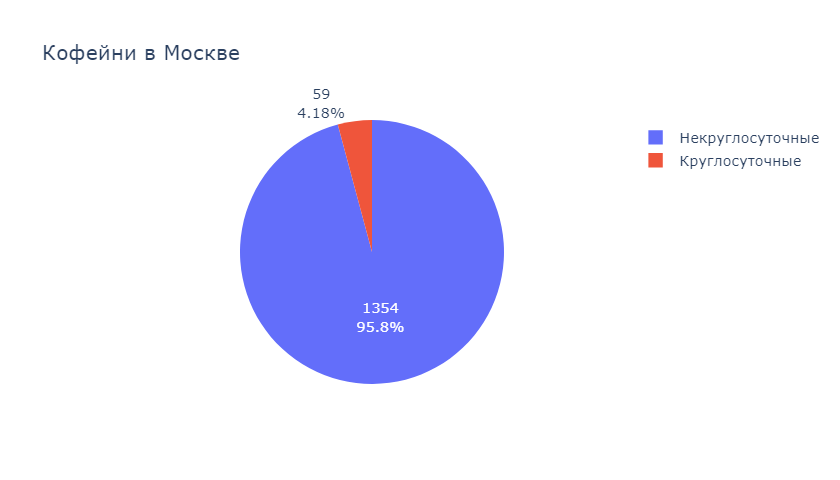

In [70]:
fig = go.Figure()
fig.add_trace(go.Pie(labels=df_coffee['is_24/7'].replace({False:'Некруглосуточные', True:'Круглосуточные'})))
fig.update_layout(title='Кофейни в Москве', height=400, width=700)
fig.update_traces(textinfo='percent+value')
fig.show()

Круглосуточных кофеен немного, всего 4.2% от их общего количества, что вполне логично, люди редко пьют кофе например, ночью. Кофейни, работающие круглосуточно в основном представлены заведениями, которые позиционируют себя как кофейни, но помимо кофе предлагающие также множество иных напитков и блюд.

Сгруппируем кофейни по районам и посчитаем количество, средний рейтинг и долю от их общего количества.

In [71]:
cof_by_dis = (
    df_coffee.groupby(['district', 'acr_district'], as_index=False).agg({'name':'count', 'rating':'mean'})
    .rename(columns=({'name':'count', 'rating':'mean_rating'})).sort_values('count', ascending=False)
)
cof_by_dis['share'] = round((cof_by_dis['count'] / cof_by_dis['count'].sum())*100, 2).astype(str) + '%'
cof_by_dis['mean_rating'] = round(cof_by_dis['mean_rating'], 2)
cof_by_dis

,district,acr_district,count,mean_rating,share
5,Центральный административный округ,ЦАО,428,4.34,30.29%
2,Северный административный округ,САО,193,4.29,13.66%
3,Северо-Восточный административный округ,СВАО,159,4.22,11.25%
1,Западный административный округ,ЗАО,150,4.20,10.62%
8,Южный административный округ,ЮАО,131,4.23,9.27%
0,Восточный административный округ,ВАО,105,4.28,7.43%
7,Юго-Западный административный округ,ЮЗАО,96,4.28,6.79%
6,Юго-Восточный административный округ,ЮВАО,89,4.23,6.3%
4,Северо-Западный административный округ,СЗАО,62,4.33,4.39%


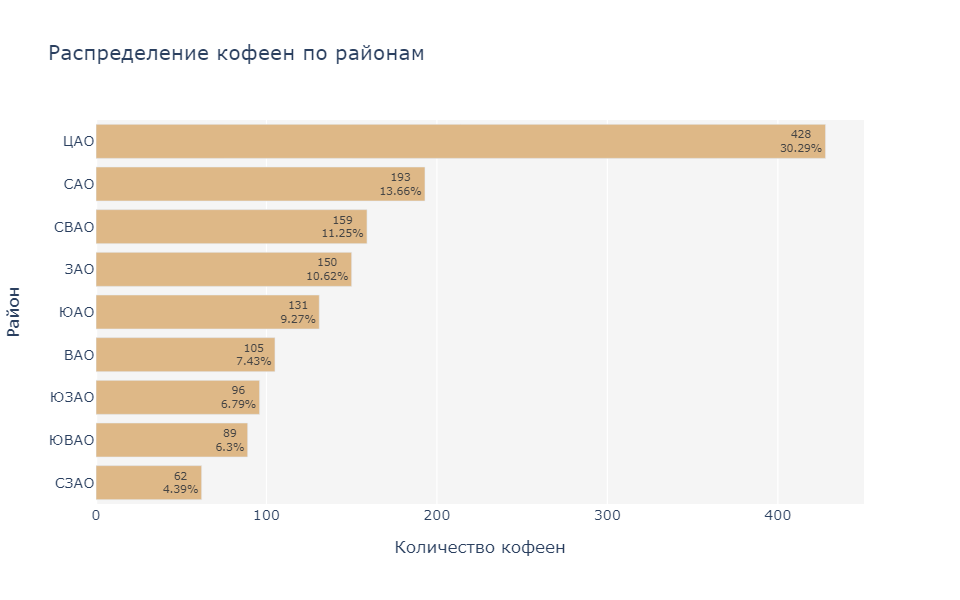

In [72]:
fig = px.bar(
    cof_by_dis.sort_values('count', ascending=True), x='count', y='acr_district', orientation='h',
    title='Распределение кофеен по районам', labels=dict(acr_district='Район', count='Количество кофеен'),
    text='share', width=800, color_discrete_sequence=['BurlyWood']
)
fig.update_layout(plot_bgcolor='whitesmoke', showlegend=False)
fig.update_traces(textposition='auto', texttemplate='%{x}<br>%{text}')
fig.show()

30% от всех кофеен расположены в ЦАО. Из остальных районов с самым большим количеством кофеен САО (14%), СВАО (11%) и ЗАО (11%). Меньше всего кофеен в ЮВАО (6%) и СЗАО (4%).

ЦАО также лидирует и по среднему рейтингу кофеен (4.34). Также высокий средний рейтинг в СЗАО (4.33), САО (4.29). Самый низкий средний рейтинг у кофеен в ЗАО (4.2), СВАО (4.22) и САО (4.23).

Ниже представим средний рейтинг кофеен по районам Москвы на хороплете.

In [73]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.9, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cof_by_dis,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Посмотрим на среднюю стоимость чашки капучино в зависимости от района.

In [74]:
cost_by_dis = (
    df_coffee.groupby('district', as_index=False).agg({'name':'count', 'middle_coffee_cup':'mean'})
    .rename(columns=({'name':'count'})).sort_values('middle_coffee_cup', ascending=False)
)
cost_by_dis['middle_coffee_cup'] = round(cost_by_dis['middle_coffee_cup'], 2)
cost_by_dis

,district,count,middle_coffee_cup
1,Западный административный округ,150,189.94
5,Центральный административный округ,428,187.52
7,Юго-Западный административный округ,96,184.18
2,Северный административный округ,193,165.79
4,Северо-Западный административный округ,62,165.52
3,Северо-Восточный административный округ,159,165.33
8,Южный административный округ,131,158.49
6,Юго-Восточный административный округ,89,151.09
0,Восточный административный округ,105,142.88


Районы с самой дорогой средней ценой чашки капучино:
- ЗАО (190 руб.)
- ЦАО (188 руб.)
- ЮЗАО (184 руб.)

Ниже средняя цена в следующих районах:
- САО (166 руб.)
- СЗАО (166 руб.)
- СВАО (165 руб.)

Самая низкая средняя цена чашки капучино в:
- ЮАО (159 руб.)
- ЮВАО (151 руб.)
- ВАО (143 руб.)

Для наглядности визуализируем данные.

In [75]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.9, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cost_by_dis,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.5,
    legend_name='Средняя цена за чашку капучино по районам',
).add_to(m)

# выводим карту
m

Выведем топ-5 наиболее популярных сетей кофеен.

In [76]:
df_coffee.query('chain == 1').groupby('name', as_index=False)['category'].count().rename(columns=({'category':'count'}))\
.sort_values('count', ascending=False).head(5).reset_index(drop=True)

,name,count
0,Шоколадница,119
1,One Price Coffee,71
2,Cofix,65
3,КОФЕПОРТ,42
4,CofeFest,31


Посмотрим на распределение сетевых и несетевых кофеен. Также вычислим средний рейтинг для каждой из групп.

In [77]:
t = df_coffee.groupby('chain', as_index=False).agg({'name':'count'}).rename(columns=({'name':'count'}))
t['chain'] = t['chain'].replace({0:'Несетевые', 1:'Сетевые'})
t['share'] = round(t['count'] / t['count'].sum() * 100, 2).astype(str) + '%'
t

,chain,count,share
0,Несетевые,693,49.04%
1,Сетевые,720,50.96%


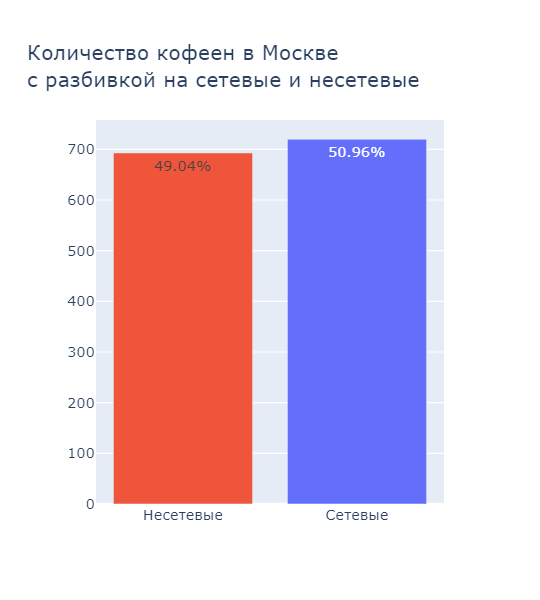

In [78]:
fig = go.Figure(go.Bar(x=t['chain'], y=t['count'], text=t['share'], showlegend=False))
fig.update_layout(width=450, title='Количество кофеен в Москве<br>с разбивкой на сетевые и несетевые')
fig.update_traces(marker=dict(color=['#EF553B', '#636EFA']))
fig.show()

**Вывод:**

В датасете представлено 1413 кофеен. Круглосуточных кофеен немного, всего 4.2% от их общего количества, что вполне логично, люди редко пьют кофе например, ночью. Кофейни, работающие круглосуточно в основном представлены заведениями, которые позиционируют себя как кофейни, но помимо кофе предлагающие также множество иных напитков и блюд.

30% от всех кофеен расположены в ЦАО. Из остальных районов с самым большим количеством кофеен САО (14%), СВАО (11%) и ЗАО (11%). Меньше всего кофеен в ЮВАО (6%) и СЗАО (4%).

ЦАО также лидирует и по среднему рейтингу кофеен (4.34). Также высокий средний рейтинг в СЗАО (4.33), САО (4.29). Самый низкий средний рейтинг у кофеен в ЗАО (4.2), СВАО (4.22) и САО (4.23).

Районы с *самой дорогой средней ценой чашки капучино:*
- ЗАО (190 руб.)
- ЦАО (188 руб.)
- ЮЗАО (184 руб.)

*Ниже средняя цена* в следующих районах:
- САО (166 руб.)
- СЗАО (166 руб.)
- СВАО (165 руб.)

*Самая низкая средняя цена чашки капучино* в:
- ЮАО (159 руб.)
- ЮВАО (151 руб.)
- ВАО (143 руб.)

*Топ-5 самых популярных сетей кофеен:*
- Шоколадница (119 заведений)
- One Price Coffee	 (71 заведение)
- Cofix (65 заведений)
- КОФЕПОРТ (42 заведения)
- CofeFest (31 заведения) 

Количество сетевых и несетевых кофеен в Москве составляет равные доли.

***Рекомендации для запуска кофейни:***

1. При запуске кофейни целесообразно ориентироваться на некруглосуточный формат работы.
2. Проект, способный выдержать большую конкуренцию лучше запускать в наиболее популярном для размещения кофеен раойне - ЦАО.
3. При установке цены на кофе можно ориентироваться на среднюю цену чашки капучино в зависимости от района:
    - ЗАО, ЦАО, ЮЗАО: 185-190 руб.
    - САО, СЗАО, СВАО: 165 руб.
    - ЮАО, ЮВАО, ВАО: 145-160 руб.
4. В случае запуска сетевой кофейни целесообразно рассмотреть одну из самых популярных в Москве (в порядке убывания популярности): Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest.

## Общий вывод

В результате исследования выпоплнено исследование рынка заведений общественного питания Москвы, найдены интересные особенности и визуализированы полученные результаты, которые помогут в выборе подходящего места для открытия заведения.

Исследование выполнено с использованием датасета с заведениями общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Всего в начальном датасете представлено 8406 заведений.

*В результате предобработки* данных удалены неявные дубликаты строк, обработаны аномальные значения. Датасет дополнен необходимыми для дальнейшей работы столбцами. В результате предобработки утрачено 0.04% данных, что является допустимым. Для анализа принят датасет, который содержит 8403 заведения.

**Анализ данных**

Датасет представлен следующими типами заведений (в скобках указаны количество заведений и доля от общего числа):
- кафе (2377 / 28.3%),
- ресторан (2042 / 24.3%),
- кофейня (1413 / 16.8%),
- бар,паб (764 / 9.09%),
- пиццерия (633 / 7.53%),
- быстрое питание (603 / 7.18%),
- столовая (315 / 3.75%),
- булочная (256 / 3.05%).

Наибольшее медианное количество посадочных мест у заведений типа ресторан (81) и бар, паб (80). Далее идут кофейня (75.5) и столовая (75). Для заведений быстрого питания требуется 70 посадочных мест, для кафе - 60. Меньше всего посадочных мест требуется пиццерии (52) и булочной (50).

Несетевых заведений больше. *62% несетевых* против *38% сетевых*.

Чаще всего сетевыми являются булочные (61.3%), пиццерии (52.1%) и кофейни(51%). Реже всего - заведения типа бар, паб (22.1%) и столовые (27.9%).

По популярности среди сетевых заведений с большим отрывом лидирует кофейня Шоколадница с количеством 120 заведений в Москве. 2 и 3 место в топе занимают пиццерии Домино'с Пицца (76 заведений) и Додо Пицца (74).

Среди 15 самых популярных заведений Москвы большую долю занимают *кофейни (44%)*, менее *рестораны (24%)* и *пиццерии (18%)*.

По количеству заведений на округ:
абсолютным лидером по количеству заведений общественного питания является ЦАО (2242 заведения)
среди остальных регионов лидируют САО (899 заведений), ЮАО (892) и СВАО (890)
самый низкий показатель у СЗАО (409 заведений)

В целом наблюдается одинаковое распределение по типам заведений внутри округов.

Средний рейтинг заведений по категориям:
- бар,паб - 4.39, 
- пиццерия - 4.30, 
- ресторан - 4.29, 
- кофейня - 4.28, 
- булочная - 4.27, 
- столовая - 4.21, 
- кафе - 4.12, 
- быстрое питание - 4.05.

Разница между максимальным и минимальным средним рейтингом в зависимости от типа заведения незначительная, всего 0.34 балла по пятибальной шкале.

Средний рейтинг заведений по районам:
- Центральный административный округ - 4.38,
- Северный административный округ - 4.24,
- Северо-Западный административный округ - 4.21,
- Западный административный округ - 4.18,
- Южный административный округ - 4.18,
- Восточный административный округ - 4.17,
- Юго-Западный административный округ - 4.17,
- Северо-Восточный административный округ - 4.15,
- Юго-Восточный административный округ - 4.1

Самой популярной улицей для открытия заведений общепита является проспект Мира, на котором располагается 183 заведения, меньше на Профсоюзной улице (122), проспекте Вернадского (108), Ленинском проспекте (107) и Ленинградском проспекте (95). На остальных улицах из списка топ-15 количество заведений находится в пределах 48-95 штук.

При рассмотрении 2 следующих типов заведений:
- тип А - заведения, расположенные на улицах, общее количество заведений общепита на которых равно 1,
- тип В - заведения, расположенные на улицах, входящих в список топ-15 по количеству расположенных на них заведений общепита,

можно отметить, что для заведений типа А среднее количество посадочных мест практически всех категорий ниже приблизительно на 50% раза по отношению к заведениям типа В, за исключением столовых, где количество посадочных мест заведений типа А ниже количества посадочных мест заведений типа В приблизительно на 10%.

Это может говорить о том, что заведения типа А расположены на улицах с маленьким количеством трафика и в не самых доступных для посетителей местах.

По другим рассмотренным показателям нет явно выраженных различий между заведениями типа А и В.

Самый большой медианный средний чек по заведениям в ЦАО (1000 руб.) и ЗАО (1000 руб.). Самый низкий показатель имеют ЮВАО (450 руб.), ЮАО (500 руб.) и СВАО (500 руб.). По чему можно сделать вывод, что средний чек в целом зависит от удаленности заведения от центра.

Среди всех заведений всего 8.69% работают круглосуточно. Наибольшая доля круглосуточных среди заведений быстрого питания (24.88%), кафе (11.23%), булочных (9.38%).

**Анализ данных для открытия кофейни**

В датасете представлено 1413 кофеен. Круглосуточных кофеен немного, всего 4.2% от их общего количества, что вполне логично, люди редко пьют кофе например, ночью. Кофейни, работающие круглосуточно в основном представлены заведениями, которые позиционируют себя как кофейни, но помимо кофе предлагающие также множество иных напитков и блюд.

30% от всех кофеен расположены в ЦАО. Из остальных районов с самым большим количеством кофеен САО (14%), СВАО (11%) и ЗАО (11%). Меньше всего кофеен в ЮВАО (6%) и СЗАО (4%).

ЦАО также лидирует и по среднему рейтингу кофеен (4.34). Также высокий средний рейтинг в СЗАО (4.33), САО (4.29). Самый низкий средний рейтинг у кофеен в ЗАО (4.2), СВАО (4.22) и САО (4.23).

Районы с *самой дорогой средней ценой чашки капучино:*
- ЗАО (190 руб.)
- ЦАО (188 руб.)
- ЮЗАО (184 руб.)

*Ниже средняя цена* в следующих районах:
- САО (166 руб.)
- СЗАО (166 руб.)
- СВАО (165 руб.)

*Самая низкая средняя цена чашки капучино* в:
- ЮАО (159 руб.)
- ЮВАО (151 руб.)
- ВАО (143 руб.)

*Топ-5 самых популярных сетей кофеен:*
- Шоколадница (119 заведений)
- One Price Coffee	 (71 заведение)
- Cofix (65 заведений)
- КОФЕПОРТ (42 заведения)
- CofeFest (31 заведения) 

***Рекомендации для запуска кофейни:***

1. При запуске кофейни целесообразно ориентироваться на некруглосуточный формат работы.
2. Проект, способный выдержать большую конкуренцию лучше запускать в наиболее популярном для размещения кофеен раойне - ЦАО.
3. При установке цены на кофе можно ориентироваться на среднюю цену чашки капучино в зависимости от района:
    - ЗАО, ЦАО, ЮЗАО: 185-190 руб.
    - САО, СЗАО, СВАО: 165 руб.
    - ЮАО, ЮВАО, ВАО: 145-160 руб.
4. В случае запуска сетевой кофейни целесообразно рассмотреть одну из самых популярных в Москве (в порядке убывания популярности): Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest.

По результатам исследования подготовлена презентация, которая доступна по ссылке: https://disk.yandex.ru/i/dDZ8X7Npqtx0Qw